In [6]:
import pandas as pd
import numpy as np
import random
import os

from tqdm import tqdm
from autogluon.tabular import TabularDataset, TabularPredictor


train_df = pd.read_csv('./train.csv')
test_df = pd.read_csv('./test.csv')
sample_submission = pd.read_csv('./sample_submission.csv')
building_df = pd.read_csv('./building_info.csv')

from datetime import datetime, timedelta

def classify_weekdays(start_date, end_date):
    date_format = "%Y-%m-%d"
    start = datetime.strptime(start_date, date_format)
    end = datetime.strptime(end_date, date_format)
    
    classification = []
    current_date = start
    
    while current_date <= end:
        if current_date.weekday() < 5:  # 0: 월요일, 1: 화요일, ..., 4: 금요일
            classification.append(0)  # 평일
        else:
            classification.append(1)  # 주말
        
        current_date += timedelta(days=1)
    
    return classification

# 예시 데이터 프레임 생성
data = {'date': pd.date_range(start='2022-06-01', end='2022-08-24')}
train = pd.DataFrame(data)
t_data = {'date': pd.date_range(start='2022-08-25', end='2022-08-31')}
test = pd.DataFrame(t_data)

# 주말/평일 분류한 결과를 'holidays' 열에 추가
start_date = "2022-06-01"
end_date = "2022-08-24"
test_start_date = "2022-08-25"
test_end_date = "2022-08-31"
train['holidays'] = classify_weekdays(start_date, end_date)
train_df['holidays'] = train['holidays']
test['holidays'] = classify_weekdays(test_start_date, test_end_date)
test_df['holidays'] = test['holidays']
#added
train_df['일시'] = pd.to_datetime(train_df['일시'], format='%Y%m%d %H')
test_df['일시'] = pd.to_datetime(test_df['일시'], format='%Y%m%d %H')

# date time feature 생성
train_df['hour'] = train_df['일시'].dt.hour
train_df['day'] = train_df['일시'].dt.day
train_df['month'] = train_df['일시'].dt.month
train_df['year'] = train_df['일시'].dt.year

test_df['hour'] = test_df['일시'].dt.hour
test_df['day'] = test_df['일시'].dt.day
test_df['month'] = test_df['일시'].dt.month
test_df['year'] = test_df['일시'].dt.year

train_df['sin_time'] = np.sin(2*np.pi*train_df.hour/24)
train_df['cos_time'] = np.cos(2*np.pi*train_df.hour/24)

test_df['sin_time'] = np.sin(2*np.pi*test_df.hour/24)
test_df['cos_time'] = np.cos(2*np.pi*test_df.hour/24)
train_df['THI'] = 9/5*train_df['기온(C)'] - 0.55*(1-train_df['습도(%)']/100)*(9/5*train_df['습도(%)']-26)+32
test_df['THI'] = 9/5*test_df['기온(C)'] - 0.55*(1-test_df['습도(%)']/100)*(9/5*test_df['습도(%)']-26)+32
##############################################################


train_df = train_df.drop(columns = ['일조(hr)', '일사(MJ/m2)', '강수량(mm)', '풍속(m/s)'])
test_df = test_df.drop(columns = ['강수량(mm)', '풍속(m/s)'])
train_data = TabularDataset(train_df)
train_data.head()

label = '전력소비량(kWh)'
####################################################

predictor = TabularPredictor(label=label,problem_type='regression').fit(
                            train_data, presets = ['best_quality'],  auto_stack=True)

test_data = TabularDataset(test_df)

y_pred = predictor.predict(test_data)
x = pd.DataFrame(y_pred)

sample_submission['answer'] = x['전력소비량(kWh)']
print(sample_submission)
sample_submission.to_csv('./baseline_submission2.csv', index=False)

No path specified. Models will be saved in: "AutogluonModels\ag-20230814_043858\"
Presets specified: ['best_quality']
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=1
	Consider setting `time_limit` to ensure training finishes within an expected duration or experiment with a small portion of `train_data` to identify an ideal `presets` and `hyperparameters` configuration.
Beginning AutoGluon training ...
AutoGluon will save models to "AutogluonModels\ag-20230814_043858\"
AutoGluon Version:  0.8.2
Python Version:     3.9.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.22000
Disk Space Avail:   33.32 GB / 511.33 GB (6.5%)
Train Data Rows:    204000
Train Data Columns: 13
Label Column: 전력소비량(kWh)
Preprocessing data ...
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...
	Available Memory:                    3788.46 MB
	Train Data (Original)  Memory Usage: 33.98 MB (0.9% of a

         num_date_time       answer
0        1_20220825 00  2118.295410
1        1_20220825 01  2160.476807
2        1_20220825 02  2002.479980
3        1_20220825 03  2041.984253
4        1_20220825 04  2059.398193
...                ...          ...
16795  100_20220831 19   915.877563
16796  100_20220831 20   867.754761
16797  100_20220831 21   807.310059
16798  100_20220831 22   718.808594
16799  100_20220831 23   599.475830

[16800 rows x 2 columns]


In [7]:
from sktime.utils.plotting import plot_series


C:\Users\wkdal\AppData\Local\Temp\ipykernel_7888\2290503346.py:18: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  train_to_post['week'] = date.dt.weekofyear
C:\Users\wkdal\AppData\Local\Temp\ipykernel_7888\2290503346.py:41: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  test_to_post['week'] = date.dt.weekofyear
C:\Users\wkdal\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sktime\utils\plotting.py:112: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, figsize=plt.figas

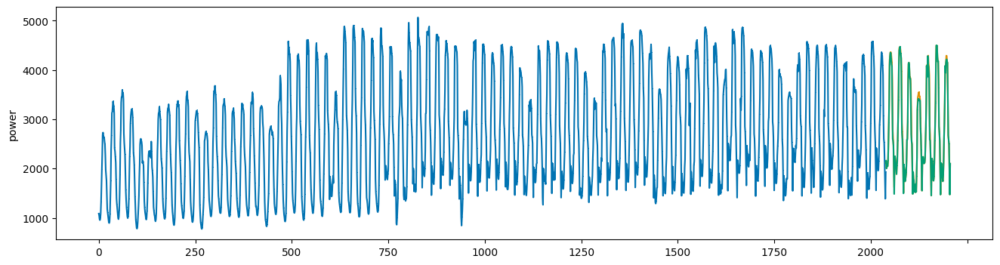

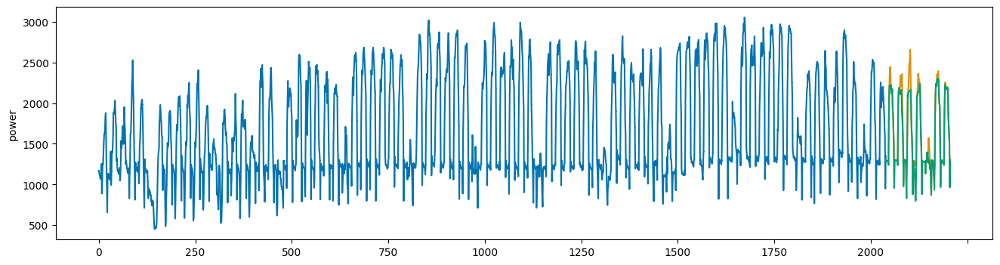

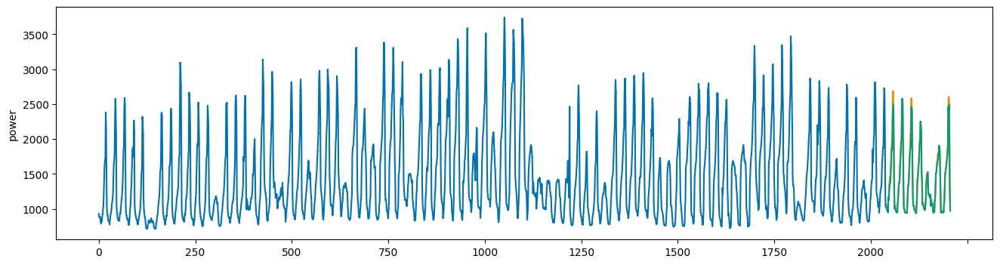

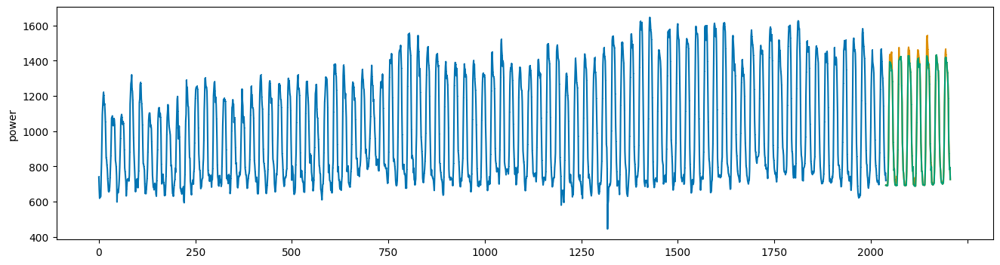

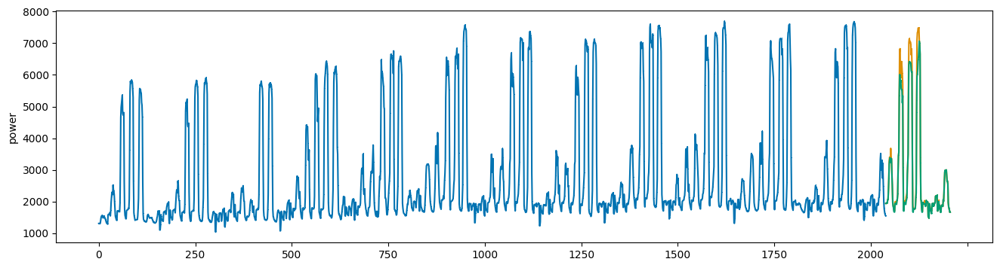

...

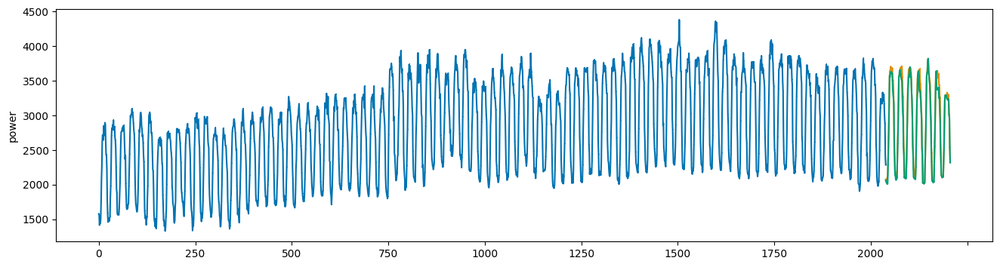

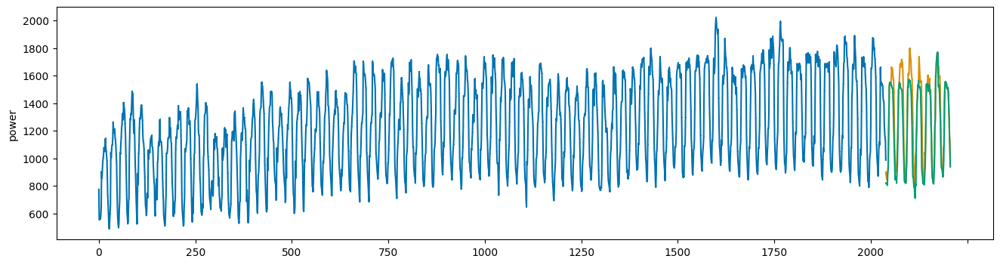

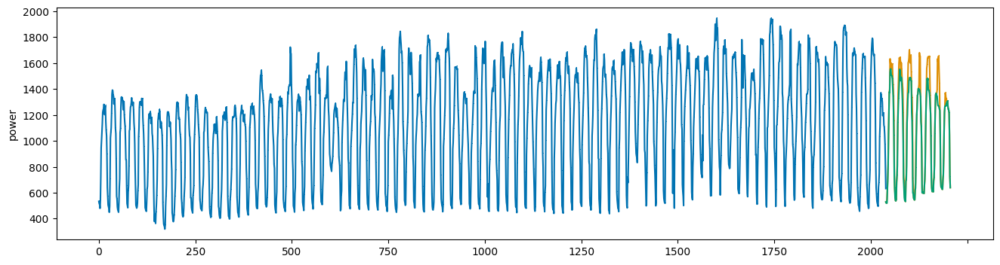

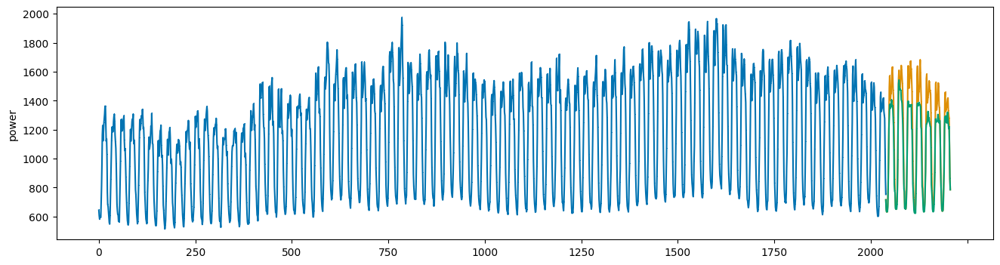

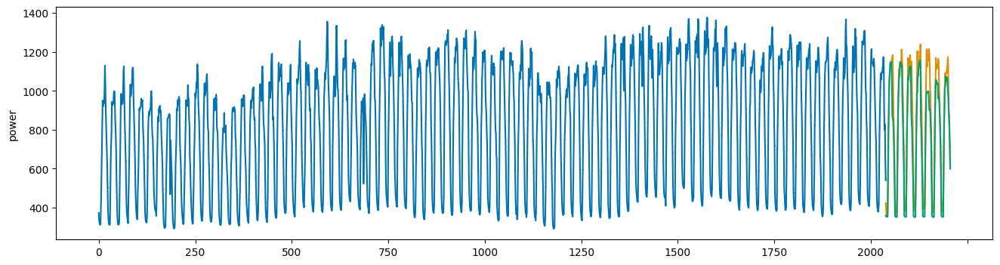

In [8]:
train_to_post = pd.read_csv('./train.csv', encoding = 'utf-8')
# cols = ['num', 'date_time', 'power', 'temp', 'wind','hum' ,'prec', 'sun', 'non_elec', 'solar']
train_to_post = train_to_post.rename(columns={
    '건물번호': 'num',
    '일시': 'date_time',
    '기온(C)': 'temp',
    '강수량(mm)': 'prec',
    '풍속(m/s)': 'wind',
    '습도(%)': 'hum',
    '일조(hr)': 'sun',
    '일사(MJ/m2)': 'solar_radiation',
    '전력소비량(kWh)': 'power'
})
date = pd.to_datetime(train_to_post.date_time)
train_to_post['hour'] = date.dt.hour
train_to_post['day'] = date.dt.weekday
train_to_post['month'] = date.dt.month
train_to_post['week'] = date.dt.weekofyear
train_to_post = train_to_post.loc[(('2022-08-15'>train_to_post.date_time)|(train_to_post.date_time>='2022-08-16')), ].reset_index(drop = True)

pred_clip = []
test_to_post = pd.read_csv('./test.csv',  encoding = 'utf-8')
# cols = ['num', 'date_time', 'temp', 'wind','hum' ,'prec', 'sun', 'non_elec', 'solar']
test_to_post = test_to_post.rename(columns={
    '건물번호': 'num',
    '일시': 'date_time',
    '기온(C)': 'temp',
    '강수량(mm)': 'prec',
    '풍속(m/s)': 'wind',
    '습도(%)': 'hum',
    '일조(hr)': 'sun',
    '일사(MJ/m2)': 'solar_radiation',
    '전력소비량(kWh)': 'power'
})

# test_to_post.columns = cols
date = pd.to_datetime(test_to_post.date_time)
test_to_post['hour'] = date.dt.hour
test_to_post['day'] = date.dt.weekday
test_to_post['month'] = date.dt.month
test_to_post['week'] = date.dt.weekofyear

## submission 불러오기
df = pd.read_csv('./baseline_submission2.csv')
for i in range(100):
    min_data = train_to_post.loc[train_to_post.num == i+1, ].iloc[-28*24:, :] ## 건물별로 직전 28일의 데이터 불러오기
    ## 요일별, 시간대별 최솟값 계산
    min_data = pd.pivot_table(min_data, values = 'power', index = ['day', 'hour'], aggfunc = min).reset_index() 
    pred = df.answer[168*i:168*(i+1)].reset_index(drop=True) ## 168개 데이터, 즉 건물별 예측값 불러오기
    day =  test_to_post.day[168*i:168*(i+1)].reset_index(drop=True) ## 예측값 요일 불러오기
    hour = test_to_post.hour[168*i:168*(i+1)].reset_index(drop=True) ## 예측값 시간 불러오기
    df_pred = pd.concat([pred, day, hour], axis = 1)
    df_pred.columns = ['pred', 'day', 'hour']
    for j in range(len(df_pred)):
        min_power = min_data.loc[(min_data.day == df_pred.day[j])&(min_data.hour == df_pred.hour[j]), 'power'].values[0]
        if df_pred.pred[j] < min_power:
            pred_clip.append(min_power)
        else:
            pred_clip.append(df_pred.pred[j])

pred_origin = df.answer
pred_clip = pd.Series(pred_clip)

for i in range(100):
    power = train_to_post.loc[train_to_post.num == i+1, 'power'].reset_index(drop=True)
    preds = pred_clip[i*168:(i+1)*168]
    preds_origin = pred_origin[i*168:(i+1)*168]
    preds.index = range(power.index[-1], power.index[-1]+168)
    preds_origin.index = range(power.index[-1], power.index[-1]+168)
    
    plot_series(power, preds,  preds_origin, markers = [',', ',', ','])

submission = pd.read_csv('./sample_submission.csv')
submission['answer'] = pred_clip
submission.to_csv('./submission_amazon_final2.csv', index = False)